<a href="https://colab.research.google.com/github/RokiaAbdeen/AndroidTutorialForBeginners/blob/master/FCNmultiClass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [2]:
!pip install scipy==0.19.1

     |████████████████████████████████| 48.2MB 63kB/s 
ERROR: yellowbrick 0.9.1 has requirement scipy>=1.0.0, but you'll have scipy 0.19.1 which is incompatible.
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow~=2.1.0, but you'll have tensorflow 1.15.0 which is incompatible.
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow-addons~=0.7.0, but you'll have tensorflow-addons 0.8.3 which is incompatible.
ERROR: seaborn 0.10.0 has requirement scipy>=1.0.1, but you'll have scipy 0.19.1 which is incompatible.
ERROR: plotnine 0.6.0 has requirement scipy>=1.2.0, but you'll have scipy 0.19.1 which is incompatible.
ERROR: mir-eval 0.5 has requirement scipy>=1.0.0, but you'll have scipy 0.19.1 which is incompatible.
ERROR: librosa 0.6.3 has requirement scipy>=1.0.0, but you'll have scipy 0.19.1 which is incompatible.
ERROR: cvxpy 1.0.28 has requirement scipy>=1.1.0, but you'll have scipy 0.19.1 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.

# **utils.camvid**
 create val.csv and train.csv from the data loaded from CamVid dataset in the above class

In [4]:
from __future__ import print_function

from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import scipy.misc
import random
import os


#############################
    # global variables #
#############################
root_dir          = "/content/gdrive/My Drive/FCN_project/CamVid/"
data_dir          = os.path.join(root_dir, "701_StillsRaw_full")    # train data
label_dir         = os.path.join(root_dir, "LabeledApproved_full")  # train label
label_colors_file = os.path.join(root_dir, "label_colors.txt")      # color to label
val_label_file    = os.path.join(root_dir, "val.csv")               # validation file
train_label_file  = os.path.join(root_dir, "train.csv")             # train file

# create dir for label index
label_idx_dir = os.path.join(root_dir, "Labeled_idx")
if not os.path.exists(label_idx_dir):
    os.makedirs(label_idx_dir)

label2color = {}
color2label = {}
label2index = {}
index2label = {}

#function to divide data to val and train
def divide_train_val(val_rate=0.1, shuffle=True, random_seed=None):
    data_list   = os.listdir(data_dir)
    data_len    = len(data_list)
    val_len     = int(data_len * val_rate)

    if random_seed:
        random.seed(random_seed)

    if shuffle:
        data_idx = random.sample(range(data_len), data_len)
    else:
        data_idx = list(range(data_len))

    val_idx     = [data_list[i] for i in data_idx[:val_len]]
    train_idx   = [data_list[i] for i in data_idx[val_len:]]

    # create val.csv
    v = open(val_label_file, "w")
    v.write("img,label\n")
    for idx, name in enumerate(val_idx):
        if 'png' not in name:
            continue
        img_name = os.path.join(data_dir, name)
        lab_name = os.path.join(label_idx_dir, name)
        lab_name = lab_name.split(".")[0] + "_L.png.npy"
        v.write("{},{}\n".format(img_name, lab_name))

    # create train.csv
    t = open(train_label_file, "w")
    t.write("img,label\n")
    for idx, name in enumerate(train_idx):
        if 'png' not in name:
            continue
        img_name = os.path.join(data_dir, name)
        lab_name = os.path.join(label_idx_dir, name)
        lab_name = lab_name.split(".")[0] + "_L.png.npy"
        t.write("{},{}\n".format(img_name, lab_name))


def parse_label():
    # change label to class index
    f = open(label_colors_file, "r").read().split("\n")[:-1]  # ignore the last empty line
    for idx, line in enumerate(f):
        label = line.split()[-1]
        color = tuple([int(x) for x in line.split()[:-1]])
        print(label, color)
        label2color[label] = color
        color2label[color] = label
        label2index[label] = idx
        index2label[idx]   = label
        # rgb = np.zeros((255, 255, 3), dtype=np.uint8)
        # rgb[..., 0] = color[0]
        # rgb[..., 1] = color[1]
        # rgb[..., 2] = color[2]
        # imshow(rgb, title=label)
    
    for idx, name in enumerate(os.listdir(label_dir)):
        filename = os.path.join(label_idx_dir, name)
        if os.path.exists(filename + '.npy'):
            print("Skip %s" % (name))
            continue
        print("Parse %s" % (name))
        img = os.path.join(label_dir, name)
        img = scipy.misc.imread(img, mode='RGB')
        height, weight, _ = img.shape
    
        idx_mat = np.zeros((height, weight))
        for h in range(height):
            for w in range(weight):
                color = tuple(img[h, w])
                try:
                    label = color2label[color]
                    index = label2index[label]
                    idx_mat[h, w] = index
                except:
                    print("error: img:%s, h:%d, w:%d" % (name, h, w))
        idx_mat = idx_mat.astype(np.uint8)
        np.save(filename, idx_mat)
        print("Finish %s" % (name))

    # test some pixels' label    
    img = os.path.join(label_dir, os.listdir(label_dir)[0])
    img = scipy.misc.imread(img, mode='RGB')   
    test_cases = [(555, 405), (0, 0), (380, 645), (577, 943)]
    test_ans   = ['Car', 'Building', 'Truck_Bus', 'Car']
    for idx, t in enumerate(test_cases):
        color = img[t]
        assert color2label[tuple(color)] == test_ans[idx]


'''debug function'''
def imshow(img, title=None):
    try:
        img = mpimg.imread(img)
        imgplot = plt.imshow(img)
    except:
        plt.imshow(img, interpolation='nearest')

    if title is not None:
        plt.title(title)
    
    plt.show()


if __name__ == '__main__':
    divide_train_val(random_seed=1)
    parse_label()

Animal (64, 128, 64)
Archway (192, 0, 128)
Bicyclist (0, 128, 192)
Bridge (0, 128, 64)
Building (128, 0, 0)
Car (64, 0, 128)
CartLuggagePram (64, 0, 192)
Child (192, 128, 64)
Column_Pole (192, 192, 128)
Fence (64, 64, 128)
LaneMkgsDriv (128, 0, 192)
LaneMkgsNonDriv (192, 0, 64)
Misc_Text (128, 128, 64)
MotorcycleScooter (192, 0, 192)
OtherMoving (128, 64, 64)
ParkingBlock (64, 192, 128)
Pedestrian (64, 64, 0)
Road (128, 64, 128)
RoadShoulder (128, 128, 192)
Sidewalk (0, 0, 192)
SignSymbol (192, 128, 128)
Sky (128, 128, 128)
SUVPickupTruck (64, 128, 192)
TrafficCone (0, 0, 64)
TrafficLight (0, 64, 64)
Train (192, 64, 128)
Tree (128, 128, 0)
Truck_Bus (192, 128, 192)
Tunnel (64, 0, 64)
VegetationMisc (192, 192, 0)
Void (0, 0, 0)
Wall (64, 192, 0)
Skip 0001TP_006690_L.png
Skip 0001TP_006870_L.png
Skip 0001TP_006720_L.png
Skip 0001TP_006900_L.png
Skip 0001TP_006840_L.png
Skip 0001TP_006750_L.png
Skip 0001TP_006810_L.png
Skip 0001TP_006780_L.png
Skip 0001TP_006960_L.png
Skip 0001TP_006930_L

# **Cam_vid loader class**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:961: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  return getattr(section, self.name)[new_key]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated


0 torch.Size([3, 480, 640]) torch.Size([32, 480, 640])
1 torch.Size([3, 480, 640]) torch.Size([32, 480, 640])
2 torch.Size([3, 480, 640]) torch.Size([32, 480, 640])
3 torch.Size([3, 480, 640]) torch.Size([32, 480, 640])
0 torch.Size([4, 3, 480, 640]) torch.Size([4, 32, 480, 640])
1 torch.Size([4, 3, 480, 640]) torch.Size([4, 32, 480, 640])
2 torch.Size([4, 3, 480, 640]) torch.Size([4, 32, 480, 640])
3 torch.Size([4, 3, 480, 640]) torch.Size([4, 32, 480, 640])


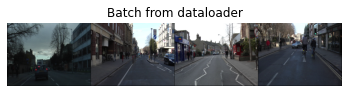

In [5]:
from __future__ import print_function

from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import scipy.misc
import random
import os

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import utils


root_dir   = "/content/gdrive/My Drive/FCN_project/CamVid/"
train_file = os.path.join(root_dir, "train.csv")
val_file   = os.path.join(root_dir, "val.csv")

num_class = 32
means     = np.array([103.939, 116.779, 123.68]) / 255. # mean of three channels in the order of BGR
h, w      = 720, 960
train_h   = int(h * 2 / 3)  # 480
train_w   = int(w * 2 / 3)  # 640
val_h     = int(h/32) * 32  # 704
val_w     = w               # 960


class CamVidDataset(Dataset):

    def __init__(self, csv_file, phase, n_class=num_class, crop=True, flip_rate=0.5):
        self.data      = pd.read_csv(csv_file)
        self.means     = means
        self.n_class   = n_class

        self.flip_rate = flip_rate
        self.crop      = crop
        if phase == 'train':
            self.new_h = train_h
            self.new_w = train_w
        elif phase == 'val':
            self.flip_rate = 0.
            self.crop = False
            self.new_h = val_h
            self.new_w = val_w


    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name   = self.data.ix[idx, 0]
        img        = scipy.misc.imread(img_name, mode='RGB')
        label_name = self.data.ix[idx, 1]
        label      = np.load(label_name)

        if self.crop:
            h, w, _ = img.shape
            top   = random.randint(0, h - self.new_h)
            left  = random.randint(0, w - self.new_w)
            img   = img[top:top + self.new_h, left:left + self.new_w]
            label = label[top:top + self.new_h, left:left + self.new_w]

        if random.random() < self.flip_rate:
            img   = np.fliplr(img)
            label = np.fliplr(label)

        # reduce mean
        img = img[:, :, ::-1]  # switch to BGR
        img = np.transpose(img, (2, 0, 1)) / 255.
        img[0] -= self.means[0]
        img[1] -= self.means[1]
        img[2] -= self.means[2]

        # convert to tensor
        img = torch.from_numpy(img.copy()).float()
        label = torch.from_numpy(label.copy()).long()

        # create one-hot encoding
        h, w = label.size()
        target = torch.zeros(self.n_class, h, w)
        for c in range(self.n_class):
            target[c][label == c] = 1

        sample = {'X': img, 'Y': target, 'l': label}

        return sample


def show_batch(batch):
    img_batch = batch['X']
    img_batch[:,0,...].add_(means[0])
    img_batch[:,1,...].add_(means[1])
    img_batch[:,2,...].add_(means[2])
    batch_size = len(img_batch)

    grid = utils.make_grid(img_batch)
    plt.imshow(grid.numpy()[::-1].transpose((1, 2, 0)))

    plt.title('Batch from dataloader')


if __name__ == "__main__":
    train_data = CamVidDataset(csv_file=train_file, phase='train')

    # show a batch
    batch_size = 4
    for i in range(batch_size):
        sample = train_data[i]
        print(i, sample['X'].size(), sample['Y'].size())

    dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=4)

    for i, batch in enumerate(dataloader):
        print(i, batch['X'].size(), batch['Y'].size())
    
        # observe 4th batch
        if i == 3:
            plt.figure()
            show_batch(batch)
            plt.axis('off')
            plt.ioff()
            plt.show()
            break

# **FCN class**

In [6]:
# -*- coding: utf-8 -*-

from __future__ import print_function

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torchvision.models.vgg import VGG


class FCN32s(nn.Module):

    def __init__(self, pretrained_net, n_class):
        super().__init__()
        self.n_class = n_class
        self.pretrained_net = pretrained_net
        self.relu    = nn.ReLU(inplace=True)
        self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn1     = nn.BatchNorm2d(512)
        self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn2     = nn.BatchNorm2d(256)
        self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn3     = nn.BatchNorm2d(128)
        self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn4     = nn.BatchNorm2d(64)
        self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn5     = nn.BatchNorm2d(32)
        self.classifier = nn.Conv2d(32, n_class, kernel_size=1)

    def forward(self, x):
        output = self.pretrained_net(x)
        x5 = output['x5']  # size=(N, 512, x.H/32, x.W/32)

        score = self.bn1(self.relu(self.deconv1(x5)))     # size=(N, 512, x.H/16, x.W/16)
        score = self.bn2(self.relu(self.deconv2(score)))  # size=(N, 256, x.H/8, x.W/8)
        score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
        score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
        score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
        score = self.classifier(score)                    # size=(N, n_class, x.H/1, x.W/1)

        return score  # size=(N, n_class, x.H/1, x.W/1)


class FCN16s(nn.Module):

    def __init__(self, pretrained_net, n_class):
        super().__init__()
        self.n_class = n_class
        self.pretrained_net = pretrained_net
        self.relu    = nn.ReLU(inplace=True)
        self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn1     = nn.BatchNorm2d(512)
        self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn2     = nn.BatchNorm2d(256)
        self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn3     = nn.BatchNorm2d(128)
        self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn4     = nn.BatchNorm2d(64)
        self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn5     = nn.BatchNorm2d(32)
        self.classifier = nn.Conv2d(32, n_class, kernel_size=1)

    def forward(self, x):
        output = self.pretrained_net(x)
        x5 = output['x5']  # size=(N, 512, x.H/32, x.W/32)
        x4 = output['x4']  # size=(N, 512, x.H/16, x.W/16)

        score = self.relu(self.deconv1(x5))               # size=(N, 512, x.H/16, x.W/16)
        score = self.bn1(score + x4)                      # element-wise add, size=(N, 512, x.H/16, x.W/16)
        score = self.bn2(self.relu(self.deconv2(score)))  # size=(N, 256, x.H/8, x.W/8)
        score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
        score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
        score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
        score = self.classifier(score)                    # size=(N, n_class, x.H/1, x.W/1)

        return score  # size=(N, n_class, x.H/1, x.W/1)


class FCN8s(nn.Module):

    def __init__(self, pretrained_net, n_class):
        super().__init__()
        self.n_class = n_class
        self.pretrained_net = pretrained_net
        self.relu    = nn.ReLU(inplace=True)
        self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn1     = nn.BatchNorm2d(512)
        self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn2     = nn.BatchNorm2d(256)
        self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn3     = nn.BatchNorm2d(128)
        self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn4     = nn.BatchNorm2d(64)
        self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn5     = nn.BatchNorm2d(32)
        self.classifier = nn.Conv2d(32, n_class, kernel_size=1)

    def forward(self, x):
        output = self.pretrained_net(x)
        x5 = output['x5']  # size=(N, 512, x.H/32, x.W/32)
        x4 = output['x4']  # size=(N, 512, x.H/16, x.W/16)
        x3 = output['x3']  # size=(N, 256, x.H/8,  x.W/8)

        score = self.relu(self.deconv1(x5))               # size=(N, 512, x.H/16, x.W/16)
        score = self.bn1(score + x4)                      # element-wise add, size=(N, 512, x.H/16, x.W/16)
        score = self.relu(self.deconv2(score))            # size=(N, 256, x.H/8, x.W/8)
        score = self.bn2(score + x3)                      # element-wise add, size=(N, 256, x.H/8, x.W/8)
        score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
        score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
        score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
        score = self.classifier(score)                    # size=(N, n_class, x.H/1, x.W/1)

        return score  # size=(N, n_class, x.H/1, x.W/1)


class FCNs(nn.Module):

    def __init__(self, pretrained_net, n_class):
        super().__init__()
        self.n_class = n_class
        self.pretrained_net = pretrained_net
        self.relu    = nn.ReLU(inplace=True)
        self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn1     = nn.BatchNorm2d(512)
        self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn2     = nn.BatchNorm2d(256)
        self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn3     = nn.BatchNorm2d(128)
        self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn4     = nn.BatchNorm2d(64)
        self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn5     = nn.BatchNorm2d(32)
        self.classifier = nn.Conv2d(32, n_class, kernel_size=1)

    def forward(self, x):
        output = self.pretrained_net(x)
        #print("output of vgg "+output.shape)
        x5 = output['x5']  # size=(N, 512, x.H/32, x.W/32)
        #print(x5.shape)
        x4 = output['x4']  # size=(N, 512, x.H/16, x.W/16)
        #print(x4.shape)
        x3 = output['x3']  # size=(N, 256, x.H/8,  x.W/8)
        #print(x3.shape)
        x2 = output['x2']  # size=(N, 128, x.H/4,  x.W/4)
        #print(x2.shape)
        x1 = output['x1']  # size=(N, 64, x.H/2,  x.W/2)
        #print(x1.shape)
         
        #make sure that tensors are same size
        target = torch.zeros(x4.shape)
        #print(target.shape)
        #print(target)
        score = self.bn1(self.relu(self.deconv1(x5)))     # size=(N, 512, x.H/16, x.W/16)
        #print(score.shape)
        _,_,W,H=score.shape
        target[:, :, :W, :H] = score
        #print(target.shape)
        #print(target)
        score=target
        score = score + x4                                # element-wise add, size=(N, 512, x.H/16, x.W/16)
        score = self.bn2(self.relu(self.deconv2(score)))  # size=(N, 256, x.H/8, x.W/8)
        score = score + x3                                # element-wise add, size=(N, 256, x.H/8, x.W/8)
        score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
        score = score + x2                                # element-wise add, size=(N, 128, x.H/4, x.W/4)
        score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
        score = score + x1                                # element-wise add, size=(N, 64, x.H/2, x.W/2)
        score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
        score = self.classifier(score)                    # size=(N, n_class, x.H/1, x.W/1)

        return score  # size=(N, n_class, x.H/1, x.W/1)


class VGGNet(VGG):
    def __init__(self, pretrained=True, model='vgg16', requires_grad=True, remove_fc=True, show_params=False):
        super().__init__(make_layers(cfg[model]))
        self.ranges = ranges[model]

        if pretrained:
            exec("self.load_state_dict(models.%s(pretrained=True).state_dict())" % model)

        if not requires_grad:
            for param in super().parameters():
                param.requires_grad = False

        if remove_fc:  # delete redundant fully-connected layer params, can save memory
            del self.classifier

        if show_params:
            for name, param in self.named_parameters():
                print(name, param.size())

    def forward(self, x):
        output = {}

        # get the output of each maxpooling layer (5 maxpool in VGG net)
        for idx in range(len(self.ranges)):
            for layer in range(self.ranges[idx][0], self.ranges[idx][1]):
                x = self.features[layer](x)
            output["x%d"%(idx+1)] = x

        return output


ranges = {
    'vgg11': ((0, 3), (3, 6),  (6, 11),  (11, 16), (16, 21)),
    'vgg13': ((0, 5), (5, 10), (10, 15), (15, 20), (20, 25)),
    'vgg16': ((0, 5), (5, 10), (10, 17), (17, 24), (24, 31)),
    'vgg19': ((0, 5), (5, 10), (10, 19), (19, 28), (28, 37))
}

# cropped version from https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py
cfg = {
    'vgg11': [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M'],
    'vgg13': [64, 64, 'M', 128, 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M'],
    'vgg16': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512, 'M', 512, 512, 512, 'M'],
    'vgg19': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 256, 'M', 512, 512, 512, 512, 'M', 512, 512, 512, 512, 'M'],
}

def make_layers(cfg, batch_norm=False):
    layers = []
    in_channels = 3
    for v in cfg:
        if v == 'M':
            layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        else:
            conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = v
    return nn.Sequential(*layers)


if __name__ == "__main__":
    batch_size, n_class, h, w = 10, 20, 160, 160

    # test output size
    vgg_model = VGGNet(requires_grad=True)
    input = torch.autograd.Variable(torch.randn(batch_size, 3, 224, 224))
    output = vgg_model(input)
    assert output['x5'].size() == torch.Size([batch_size, 512, 7, 7])

    fcn_model = FCN32s(pretrained_net=vgg_model, n_class=n_class)
    input = torch.autograd.Variable(torch.randn(batch_size, 3, h, w))
    output = fcn_model(input)
    assert output.size() == torch.Size([batch_size, n_class, h, w])

    fcn_model = FCN16s(pretrained_net=vgg_model, n_class=n_class)
    input = torch.autograd.Variable(torch.randn(batch_size, 3, h, w))
    output = fcn_model(input)
    assert output.size() == torch.Size([batch_size, n_class, h, w])

    fcn_model = FCN8s(pretrained_net=vgg_model, n_class=n_class)
    input = torch.autograd.Variable(torch.randn(batch_size, 3, h, w))
    output = fcn_model(input)
    assert output.size() == torch.Size([batch_size, n_class, h, w])

    fcn_model = FCNs(pretrained_net=vgg_model, n_class=n_class)
    input = torch.autograd.Variable(torch.randn(batch_size, 3, h, w))
    output = fcn_model(input)
    assert output.size() == torch.Size([batch_size, n_class, h, w])

    print("Pass size check")

    # test a random batch, loss should decrease
    fcn_model = FCNs(pretrained_net=vgg_model, n_class=n_class)
    criterion = nn.BCELoss()
    optimizer = optim.SGD(fcn_model.parameters(), lr=1e-3, momentum=0.9)
    input = torch.autograd.Variable(torch.randn(batch_size, 3, h, w))
    y = torch.autograd.Variable(torch.randn(batch_size, n_class, h, w), requires_grad=False)
    for iter in range(0):
        optimizer.zero_grad()
        output = fcn_model(input)
        output = torch.sigmoid(output)
        loss = criterion(output, y)
        loss.backward()
        print("iter{}, loss {}".format(iter, loss.data))
        optimizer.step()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth



Pass size check


In [0]:
#requirements
!pip install torchvision==0.4.0
!pip install torch==0.4.0
#!pip install numpy==1.13.3

# **train class**

Configs: FCNs-BCEWithLogits_batch6_epoch500_RMSprop_scheduler-step50-gamma0.5_lr0.0001_momentum0_w_decay1e-05


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please us

<Figure size 432x288 with 0 Axes>

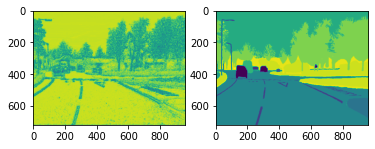

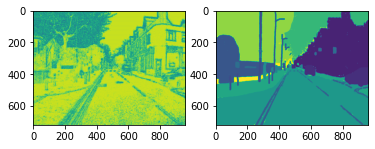

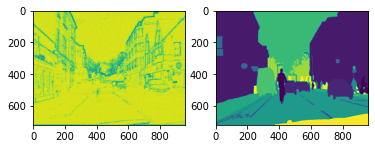

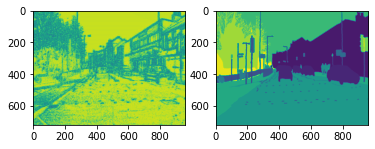

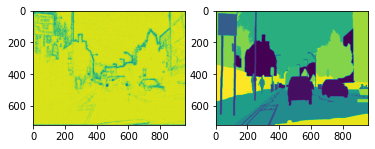

...

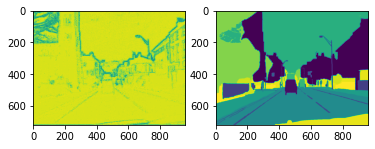

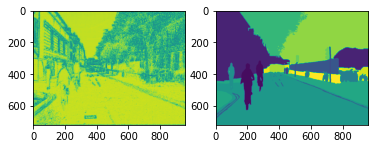

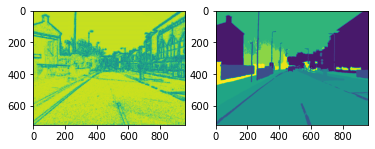

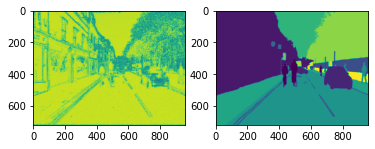

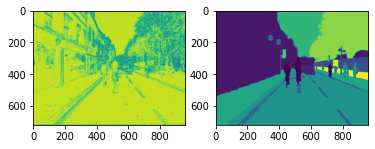

epoch0, pix_acc: 0.018920820932539682, meanIoU: 0.002373717769535262, IoUs: [0.00000000e+00 1.66997273e-04 2.83287501e-06 0.00000000e+00
 4.10381892e-05 1.63653460e-02 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.44945209e-03 8.82487345e-03 0.00000000e+00
 6.77335686e-03 1.78716222e-04 7.33507131e-05 0.00000000e+00
 5.58190166e-03 3.05851888e-03 5.31496376e-04 7.17141162e-04
 3.24414368e-04 8.17765622e-05 2.16659713e-03 0.00000000e+00
 3.26046066e-03 0.00000000e+00 1.49688809e-04 9.78148264e-04
 0.00000000e+00 6.78051976e-04 2.45548091e-02 0.00000000e+00]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please us

epoch0, iter0, loss: 0.709854006767273
epoch0, iter10, loss: 0.6207200884819031
epoch0, iter20, loss: 0.392531156539917
epoch0, iter30, loss: 0.2763358950614929
epoch0, iter40, loss: 0.17752522230148315
epoch0, iter50, loss: 0.1536586880683899
epoch0, iter60, loss: 0.13170558214187622
epoch0, iter70, loss: 0.12271657586097717
epoch0, iter80, loss: 0.1277848184108734
epoch0, iter90, loss: 0.10960203409194946
epoch0, iter100, loss: 0.11648320406675339


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type FCNs. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type VGGNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pyda

<Figure size 432x288 with 0 Axes>

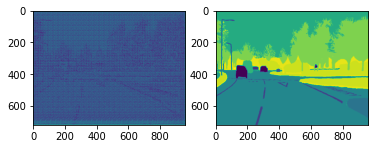

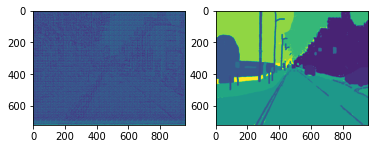

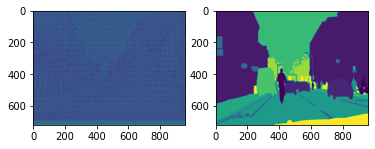

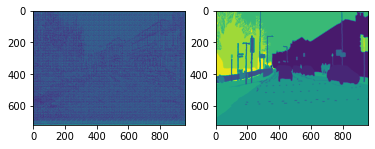

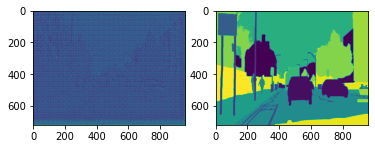

...

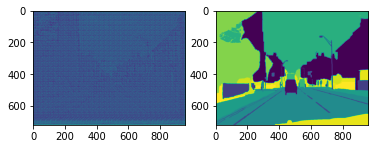

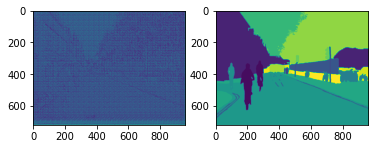

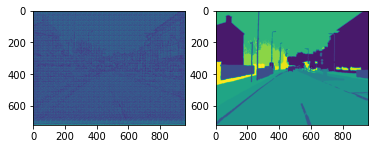

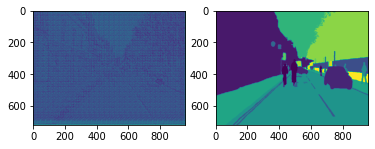

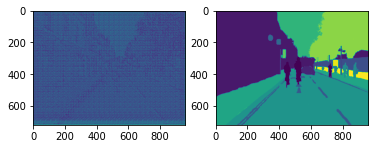

epoch0, pix_acc: 0.23219396908068782, meanIoU: 0.0122945575035736, IoUs: [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.11810975e-01 7.65251462e-07 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.60255357e-04 0.00000000e+00 0.00000000e+00
 2.77920973e-05 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.11719558e-04 4.76560314e-02 6.74907743e-06 0.00000000e+00
 0.00000000e+00 1.32311250e-01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 3.32678677e-04 2.95635824e-07
 0.00000000e+00 0.00000000e+00 8.00079444e-04 1.07248229e-04]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please us

epoch1, iter0, loss: 0.11725986003875732
epoch1, iter10, loss: 0.11012797802686691
epoch1, iter20, loss: 0.11244393140077591
epoch1, iter30, loss: 0.11579989641904831
epoch1, iter40, loss: 0.10244496911764145
epoch1, iter50, loss: 0.10202036798000336
epoch1, iter60, loss: 0.10740841180086136
epoch1, iter70, loss: 0.0943213626742363
epoch1, iter80, loss: 0.10444076359272003
epoch1, iter90, loss: 0.09697979688644409
epoch1, iter100, loss: 0.1025812104344368


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:961: FutureWarning: 
.ix is deprecated. Please

<Figure size 432x288 with 0 Axes>

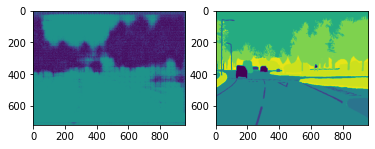

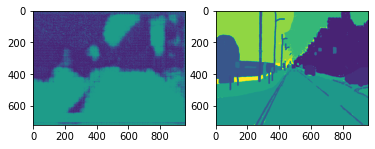

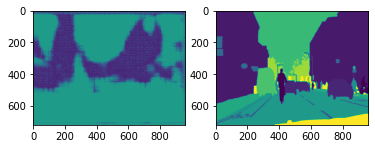

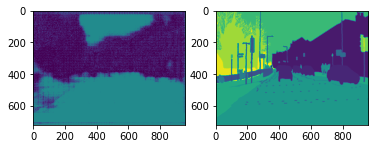

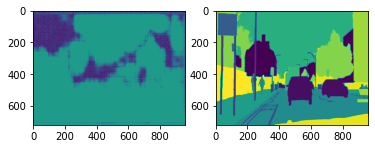

...

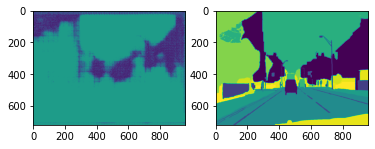

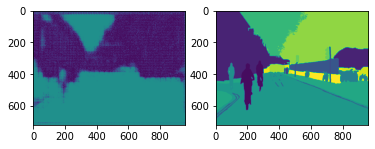

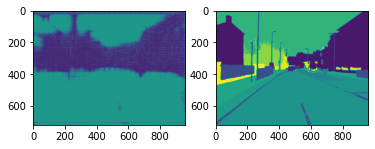

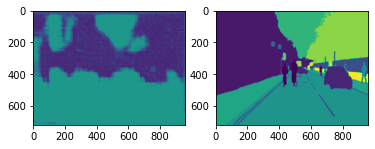

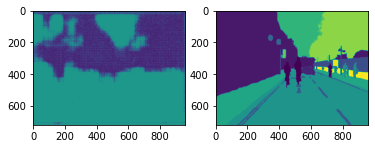

epoch1, pix_acc: 0.4397578331679895, meanIoU: 0.028536058090950795, IoUs: [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 3.53369234e-01 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 2.48879455e-04 0.00000000e+00 0.00000000e+00
 4.37352818e-05 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 4.59583319e-01 8.84297856e-07 1.64478901e-04
 0.00000000e+00 6.74691066e-02 8.47138156e-07 0.00000000e+00
 0.00000000e+00            nan 2.92799662e-03 0.00000000e+00
 0.00000000e+00 0.00000000e+00 8.09318880e-04 0.00000000e+00]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:174: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:961: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  re

epoch2, iter0, loss: 0.0965677797794342
epoch2, iter10, loss: 0.09849381446838379
epoch2, iter20, loss: 0.10211493819952011
epoch2, iter30, loss: 0.0711122378706932
epoch2, iter40, loss: 0.08886975049972534
epoch2, iter50, loss: 0.0787523090839386
epoch2, iter60, loss: 0.10199158638715744
epoch2, iter70, loss: 0.07929609715938568
epoch2, iter80, loss: 0.0851154550909996
epoch2, iter90, loss: 0.08380322903394699
epoch2, iter100, loss: 0.08404038101434708


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please us

<Figure size 432x288 with 0 Axes>

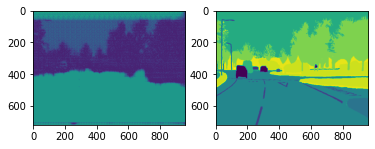

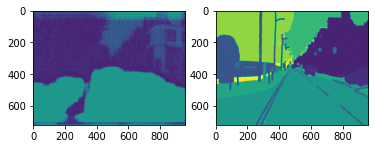

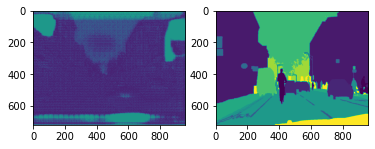

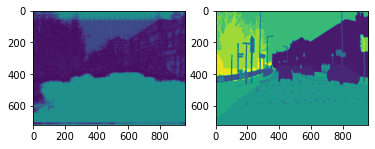

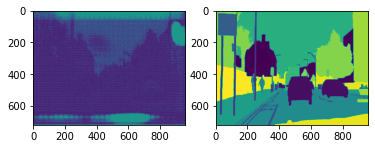

...

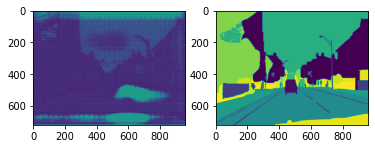

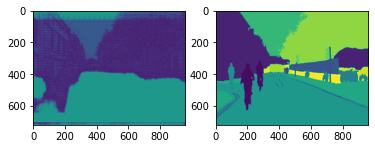

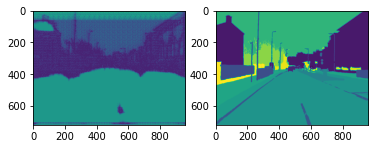

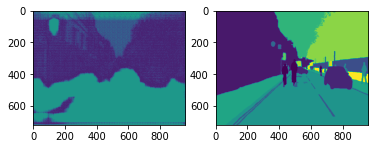

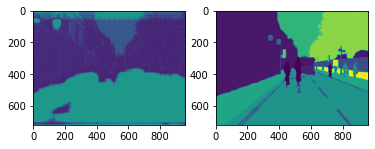

epoch2, pix_acc: 0.5005562789351852, meanIoU: 0.04090414159998774, IoUs: [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 3.49651578e-01 1.76049629e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 3.68343622e-05 1.61368735e-06 0.00000000e+00
 2.10140185e-05 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 5.90458688e-01 7.17552629e-07 6.50006809e-05
 0.00000000e+00 3.26502199e-01 1.47942125e-05 0.00000000e+00
 0.00000000e+00            nan 9.22166535e-04 0.00000000e+00
 0.00000000e+00 0.00000000e+00 3.35511420e-04 6.66394778e-07]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please us

epoch3, iter0, loss: 0.0841618999838829
epoch3, iter10, loss: 0.07296781986951828
epoch3, iter20, loss: 0.09113933891057968
epoch3, iter30, loss: 0.06866638362407684
epoch3, iter40, loss: 0.08852111548185349
epoch3, iter50, loss: 0.07282830774784088
epoch3, iter60, loss: 0.07007727026939392
epoch3, iter70, loss: 0.09730763733386993
epoch3, iter80, loss: 0.05561992898583412
epoch3, iter90, loss: 0.06600046902894974
epoch3, iter100, loss: 0.07199925184249878


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please us

<Figure size 432x288 with 0 Axes>

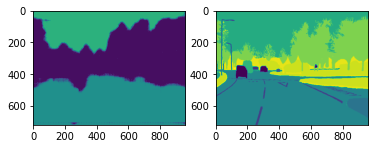

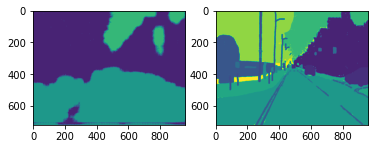

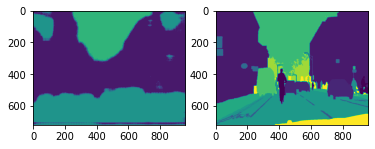

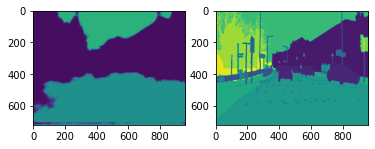

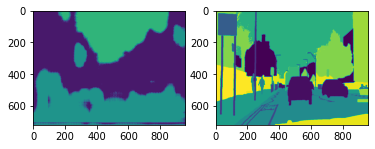

...

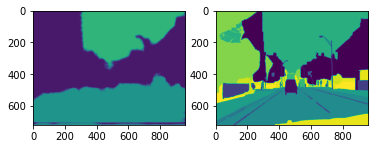

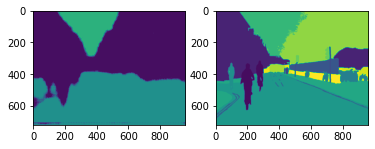

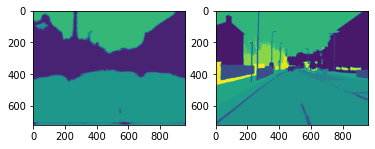

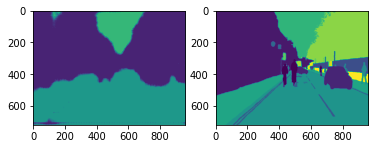

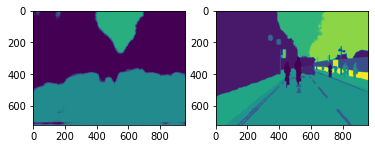

epoch3, pix_acc: 0.6064459118716933, meanIoU: 0.05992333890428449, IoUs: [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 4.29190081e-01 1.67425102e-06 0.00000000e+00 0.00000000e+00
 0.00000000e+00 2.67110318e-05 2.39893021e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 3.67620028e-06 6.64778506e-01 0.00000000e+00 1.59641082e-04
 0.00000000e+00 7.62515289e-01 2.23781657e-05 0.00000000e+00
 0.00000000e+00            nan 5.82599453e-04 2.20725359e-06
 0.00000000e+00 0.00000000e+00 3.05176897e-04 1.15750483e-05]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:961: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  return getattr(section, self.name)[new_key]
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.

epoch4, iter0, loss: 0.08117341250181198
epoch4, iter10, loss: 0.06526261568069458
epoch4, iter20, loss: 0.06827295571565628
epoch4, iter30, loss: 0.06732657551765442
epoch4, iter40, loss: 0.0725889578461647
epoch4, iter50, loss: 0.0633867010474205
epoch4, iter60, loss: 0.06889957934617996
epoch4, iter70, loss: 0.06891697645187378
epoch4, iter80, loss: 0.06750532239675522
epoch4, iter90, loss: 0.0696905255317688
epoch4, iter100, loss: 0.1710725724697113


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please us

<Figure size 432x288 with 0 Axes>

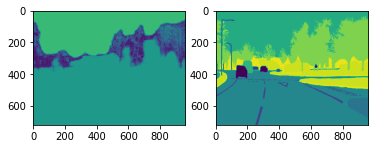

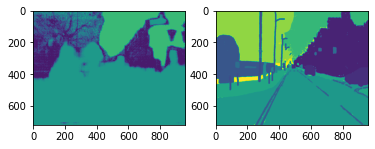

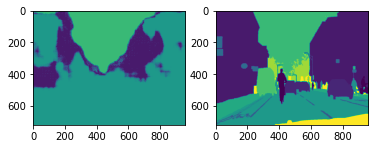

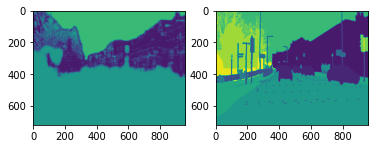

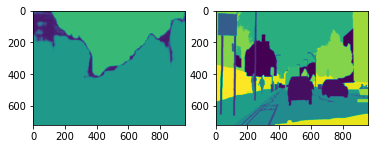

...

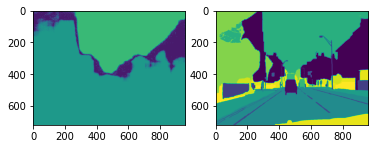

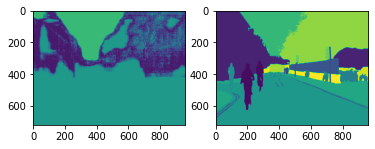

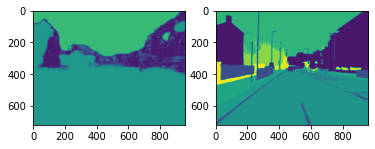

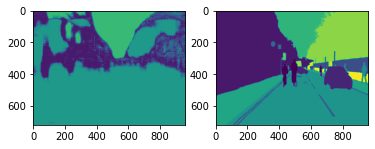

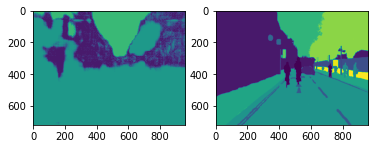

epoch4, pix_acc: 0.5620607225529101, meanIoU: 0.05802987244087236, IoUs: [0.00000000e+00 0.00000000e+00 0.00000000e+00            nan
 3.66376686e-01 5.41124652e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 3.76062668e-04 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 8.44222581e-05 4.69807996e-01 4.35433866e-06 1.14241614e-04
 0.00000000e+00 8.26405610e-01 5.50395014e-06 0.00000000e+00
 0.00000000e+00            nan 7.74004506e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.66733271e-04 0.00000000e+00]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:961: FutureWarning: 
.ix is deprecated. Please

epoch5, iter0, loss: 0.10075419396162033
epoch5, iter10, loss: 0.0644022598862648


In [0]:
from __future__ import print_function

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.autograd import Variable
from torch.utils.data import DataLoader

#from fcn import VGGNet, FCN32s, FCN16s, FCN8s, FCNs
#from Cityscapes_loader import CityscapesDataset
#from CamVid_loader import CamVidDataset

from matplotlib import pyplot as plt
import numpy as np
import time
import sys
import os


n_class    = 32

batch_size = 6
epochs     = 500
lr         = 1e-4
momentum   = 0
w_decay    = 1e-5
step_size  = 50
gamma      = 0.5
configs    = "FCNs-BCEWithLogits_batch{}_epoch{}_RMSprop_scheduler-step{}-gamma{}_lr{}_momentum{}_w_decay{}".format(batch_size, epochs, step_size, gamma, lr, momentum, w_decay)
print("Configs:", configs)

#if sys.argv[1] == 'CamVid':
root_dir   = "/content/gdrive/My Drive/FCN_project/CamVid/"
#else:
    #root_dir   = "CityScapes/"
train_file = os.path.join(root_dir, "train.csv")
val_file   = os.path.join(root_dir, "val.csv")

# create dir for model
model_dir = "/content/gdrive/My Drive/FCN_project/models"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
model_path = os.path.join(model_dir, configs)

use_gpu = torch.cuda.is_available()
num_gpu = list(range(torch.cuda.device_count()))

#if sys.argv[1] == 'CamVid':
train_data = CamVidDataset(csv_file=train_file, phase='train')
#else:
    #train_data = CityscapesDataset(csv_file=train_file, phase='train')
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=4)

#if sys.argv[1] == 'CamVid':
val_data = CamVidDataset(csv_file=val_file, phase='val', flip_rate=0)
#else:
    #val_data = CityscapesDataset(csv_file=val_file, phase='val', flip_rate=0)
val_loader = DataLoader(val_data, batch_size=1, num_workers=4)

vgg_model = VGGNet(requires_grad=True, remove_fc=True)
fcn_model = FCNs(pretrained_net=vgg_model, n_class=n_class)

#if use_gpu:
    #ts = time.time()
    #gg_model = vgg_model.cuda()
    #fcn_model = fcn_model.cuda()
    #fcn_model = nn.DataParallel(fcn_model, device_ids=num_gpu)
    #print("Finish cuda loading, time elapsed {}".format(time.time() - ts))

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.RMSprop(fcn_model.parameters(), lr=lr, momentum=momentum, weight_decay=w_decay)
scheduler = lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)  # decay LR by a factor of 0.5 every 30 epochs

# create dir for score
score_dir = os.path.join("/content/gdrive/My Drive/FCN_project/scores", configs)
if not os.path.exists(score_dir):
    os.makedirs(score_dir)
IU_scores    = np.zeros((epochs, n_class))
pixel_scores = np.zeros(epochs)


def train():
    for epoch in range(epochs):
        #scheduler.step()

        #ts = time.time()
        for iter, batch in enumerate(train_loader):
            optimizer.zero_grad()

            #if use_gpu:
            #inputs = Variable(batch['X'].cuda())
            #labels = Variable(batch['Y'].cuda())
            #else:
            inputs, labels = Variable(batch['X']), Variable(batch['Y'])

            outputs = fcn_model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            

            if iter % 10 == 0:
                print("epoch{}, iter{}, loss: {}".format(epoch, iter, loss.data))
        
        #print("Finish epoch {}, time elapsed {}".format(epoch, time.time() - ts))
        torch.save(fcn_model, model_path)

        val(epoch)


def val(epoch):
    fcn_model.eval()
    total_ious = []
    pixel_accs = []
    fig = plt.figure()
    for iter, batch in enumerate(val_loader):
        #if use_gpu:
        #inputs = Variable(batch['X'].cuda())
        #else:
        inputs = Variable(batch['X'])
        #N, _, h, w = inputs.shape
        #print(N)
        #print(h)
        #print(w)
        #inp=inputs.resize(1,_,512,512)
        output = fcn_model(inputs)
        output = output.data.cpu().numpy()

        N, _, h, w = output.shape
        #print(N)
        #print(h)
        #print(w)

        

        pred = output.transpose(0, 2, 3, 1).reshape(-1, n_class).argmax(axis=1).reshape(N, h, w)
        #print("reshap success")
        #print(pred.shape)
        
        #print(batch['l'])
        #print(batch['l'].shape)
        
        target = batch['l'].cpu().numpy().reshape(N, h, w)

        #show original image,ground truth,output
        
        #a = fig.add_subplot(1,2,1)
        #plt.imshow(np.squeeze(pred[0, :, :]))
        #a.set_title('Input Image')

        #a = fig.add_subplot(1,2,2)
        #plt.imshow(np.squeeze(target[0, :, :]))   
        #a.set_title('Predicted Mask')
        #plt.close(fig)

            
        plt.figure()
        plt.subplot(1, 2, 1) 
        plt.imshow(np.squeeze(pred[0, :, :]))
        plt.subplot(1, 2, 2) 
        plt.imshow(np.squeeze(target[0, :, :]))
        plt.pause(0.5)
        #plt.close('all')


        for p, t in zip(pred, target):
            total_ious.append(iou(p, t))
            pixel_accs.append(pixel_acc(p, t))

    # Calculate average IoU
    total_ious = np.array(total_ious).T  # n_class * val_len
    ious = np.nanmean(total_ious, axis=1)
    pixel_accs = np.array(pixel_accs).mean()
    print("epoch{}, pix_acc: {}, meanIoU: {}, IoUs: {}".format(epoch, pixel_accs, np.nanmean(ious), ious))
    IU_scores[epoch] = ious
    np.save(os.path.join(score_dir, "meanIU"), IU_scores)
    pixel_scores[epoch] = pixel_accs
    np.save(os.path.join(score_dir, "meanPixel"), pixel_scores)


# borrow functions and modify it from https://github.com/Kaixhin/FCN-semantic-segmentation/blob/master/main.py
# Calculates class intersections over unions
def iou(pred, target):
    ious = []
    for cls in range(n_class):
        pred_inds = pred == cls
        target_inds = target == cls
        intersection = pred_inds[target_inds].sum()
        union = pred_inds.sum() + target_inds.sum() - intersection
        if union == 0:
            ious.append(float('nan'))  # if there is no ground truth, do not include in evaluation
        else:
            ious.append(float(intersection) / max(union, 1))
        # print("cls", cls, pred_inds.sum(), target_inds.sum(), intersection, float(intersection) / max(union, 1))
    return ious


def pixel_acc(pred, target):
    correct = (pred == target).sum()
    total   = (target == target).sum()
    return correct / total


if __name__ == "__main__":
    val(0)  # show the accuracy before training
    train()

# **inference code**
code to test the saved model and showing the result:


1- convert test image to tensor


2-pass this tensor to the model and get the output


3-show the output

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
import torch 
import torchvision.transforms as T
import torch
from torch.autograd import Variable
import numpy as np



#!wget -nv https://www.dhresource.com/600x600/f2/albu/g7/M01/EE/57/rBVaSlrxty2APMsbAALrbCHKsrY380.jpg -O bag.jpg
#img = Image.open('/content/gdrive/My Drive/project_folder/Dataset/last/46.jpg')
img = Image.open('./bag.jpg')
plt.imshow(img); plt.axis('off'); plt.show()
  # Comment the Resize and CenterCrop for better inference results
trf = T.Compose([#T.Resize(160), 
                T.Scale((160,160)), 
                T.ToTensor(), 
               # T.Normalize(mean = [0.485, 0.456, 0.406], 
               #             std = [0.229, 0.224, 0.225])
               ])
inp = trf(img).unsqueeze(0)
print(inp.size())
# the input to the model is of shape N*3*160*160 tensor, N presents the number of samples
#x = np.random.rand(1, 3, 160, 160)
#x = Variable(torch.FloatTensor(x))


model = torch.load('/content/gdrive/My Drive/FCN_project/checkpoints16/fcn_model_15.pt')
model = model.cpu()
# y is the output, of shape N*2*160*160, 2 present the class, [1 0] for background [0 1] for handbag
out = model(inp)
print(out.shape)
output_np = out.cpu().data.numpy().copy()
output_np = np.argmin(output_np, axis=1)
plt.subplot(1, 2, 1) 
plt.imshow(np.squeeze(output_np[0, :, :]),'gray')